In [21]:
import os
import math
import re
import requests
from PIL import Image
from io import BytesIO
from pyproj import Transformer
import requests
import xml.etree.ElementTree as ET

In [1]:
import requests

# The URL of the image you want to download
# Note: I removed the trailing space from the original URL you posted
url="https://bhuvan-ras1.nrsc.gov.in/tilecache/tilecache.py?styles=&bbox=7816756.260555264,2632491.2541414686,7817367.756781545,2633102.750367753&format=image/png&service=WMS&version=1.1.1&request=GetMap&srs=EPSG:3857&transparent=true&width=256&height=256&layers=bhuvan_ocm_wbase"
# The local filename to save the image as
output_filename = "map_tile_again.png"

# --- Add headers to mimic a real browser request ---
headers = {
    'User-Agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:140.0) Gecko/20100101 Firefox/140.0',
    'Referer': 'https://bhuvan.nrsc.gov.in/',
    'Origin': 'https://bhuvan.nrsc.gov.in',
    'Connection': 'keep-alive',
}

try:
    # Send a GET request to the URL, now with the headers included
    print("Sending request with browser headers...")
    response = requests.get(url, headers=headers, stream=True)

    # Check if the request was successful (status code 200)
    if response.status_code == 200:
        # Open the output file in binary write mode
        with open(output_filename, 'wb') as f:
            # Write the content of the response to the file
            for chunk in response.iter_content(chunk_size=8192):
                f.write(chunk)
        print(f"✅ Image successfully downloaded and saved as '{output_filename}'")
    else:
        print(f"❌ Error: Failed to retrieve image. Status code: {response.status_code}")
        print("Server response:", response.text) # Print server response for more details

except requests.exceptions.RequestException as e:
    print(f"❌ An error occurred: {e}")

Sending request with browser headers...
✅ Image successfully downloaded and saved as 'map_tile_again.png'


In [2]:
# actual working correct code

import math
import re
import requests
from PIL import Image
from io import BytesIO
from pyproj import Transformer

def get_tile_info(lon, lat, zoom):
    """
    Calculates the exact tile index (x, y) and bounding box for a given lat/lon and zoom level.
    """
    lat_rad = math.radians(lat)
    n = 2.0 ** zoom
    tile_x = int((lon + 180.0) / 360.0 * n)
    tile_y = int((1.0 - math.asinh(math.tan(lat_rad)) / math.pi) / 2.0 * n)

    def tile_to_lon(x, z):
        return x / (2.0 ** z) * 360.0 - 180.0

    def tile_to_lat(y, z):
        n = math.pi - 2.0 * math.pi * y / (2.0 ** z)
        return math.degrees(math.atan(0.5 * (math.exp(n) - math.exp(-n))))

    lon_deg_nw = tile_to_lon(tile_x, zoom)
    lat_deg_nw = tile_to_lat(tile_y, zoom)
    lon_deg_se = tile_to_lon(tile_x + 1, zoom)
    lat_deg_se = tile_to_lat(tile_y + 1, zoom)

    transformer = Transformer.from_crs("epsg:4326", "epsg:3857", always_xy=True)
    min_x, min_y = transformer.transform(lon_deg_nw, lat_deg_se)
    max_x, max_y = transformer.transform(lon_deg_se, lat_deg_nw)
    
    return {'x': tile_x, 'y': tile_y, 'bbox': (min_x, min_y, max_x, max_y)}

def generate_custom_stitched_map(url, target_width=1904, target_height=937):
    """
    Generates a stitched and cropped map image from a Bhuvan URL.
    """
    match = re.search(r'#(\d+)/([\d.-]+)/([\d.-]+)', url)
    if not match:
        print("❌ Error: URL format is incorrect. Could not find zoom/lat/lon.")
        return

    zoom = int(match.group(1))+1
    lat = float(match.group(2))
    lon = float(match.group(3))
    print(f"Parsed URL -> Zoom: {zoom}, Lat: {lat}, Lon: {lon}")

    tile_pixel_size = 256
    grid_width = math.ceil(target_width / tile_pixel_size)
    grid_height = math.ceil(target_height / tile_pixel_size)
    stitched_width = grid_width * tile_pixel_size
    stitched_height = grid_height * tile_pixel_size
    print(f"Calculated {grid_width}x{grid_height} tile grid to produce a {stitched_width}x{stitched_height} image.")

    central_tile = get_tile_info(lon, lat, zoom)
    c_min_x, _, c_max_x, c_max_y = central_tile['bbox']
    tile_coord_width = c_max_x - c_min_x
    tile_coord_height = tile_coord_width

    offset_x = math.floor(grid_width / 2)
    offset_y = math.floor(grid_height / 2)
    grid_top_left_min_x = c_min_x - (offset_x * tile_coord_width)
    grid_top_left_max_y = c_max_y + (offset_y * tile_coord_height)

    stitched_image = Image.new('RGB', (stitched_width, stitched_height))
    base_url = "https://bhuvan-ras1.nrsc.gov.in/tilecache/tilecache.py"
    
    # --- As per your request, using the bhuvan_ocm_wbase layer ---
    # Note: This is a low-resolution base map, not high-resolution satellite imagery.
    wms_params = { 'service': 'WMS', 'version': '1.1.1', 'request': 'GetMap', 'layers': 'bhuvan_ocm_wbase', 'srs': 'EPSG:3857', 'format': 'image/png', 'width': 256, 'height': 256 }
    headers = { 'User-Agent': 'Mozilla/5.0', 'Referer': 'https://bhuvan.nrsc.gov.in/' }

    for row in range(grid_height):
        for col in range(grid_width):
            min_x = grid_top_left_min_x + col * tile_coord_width
            max_x = min_x + tile_coord_width
            max_y = grid_top_left_max_y - row * tile_coord_height
            min_y = max_y - tile_coord_height
            
            current_params = wms_params.copy()
            current_params['bbox'] = f"{min_x},{min_y},{max_x},{max_y}"

            try:
                response = requests.get(base_url, params=current_params, headers=headers)
                response.raise_for_status()
                tile_image = Image.open(BytesIO(response.content))
                stitched_image.paste(tile_image, (col * tile_pixel_size, row * tile_pixel_size))
            except requests.exceptions.RequestException as e:
                print(f"❌ Error fetching tile ({col}, {row}): {e}")

    center_x = stitched_width / 2
    center_y = stitched_height / 2
    crop_left = int(center_x - target_width / 2)
    crop_top = int(center_y - target_height / 2 + 241)
    crop_right = crop_left + target_width
    crop_bottom = crop_top + target_height

    final_image = stitched_image.crop((crop_left, crop_top, crop_right, crop_bottom))
    # final_image = stitched_image
    output_filename = "custom_stitched_map_ocm.png"
    final_image.save(output_filename)
    print(f"\n✅ Success! Map saved as '{output_filename}' with dimensions {final_image.size[0]}x{final_image.size[1]}.")

# if __name__ == "__main__":
#     input_url = "https://bhuvan.nrsc.gov.in/ngmaps?mode=Satellite#15/23.00914/70.22968"
#     generate_custom_stitched_map(input_url)

In [41]:
generate_custom_stitched_map("https://bhuvan.nrsc.gov.in/ngmaps/?mode=Satellite#15/22.98737/70.23286")

Parsed URL -> Zoom: 15, Lat: 22.98737, Lon: 70.23286
Calculated 8x4 tile grid to produce a 2048x1024 image.

✅ Success! Map saved as 'custom_stitched_map.png' with dimensions 1904x937.


In [3]:
# finally corrected code 

import math
import re
import requests
from PIL import Image
from io import BytesIO
from pyproj import Transformer
import xml.etree.ElementTree as ET

def find_satellite_layers(base_url):
    """
    Sends a GetCapabilities request to find available high-resolution satellite layers.
    """
    print("\nAttempting to dynamically find available satellite layers...")
    params = {'service': 'WMS', 'version': '1.1.1', 'request': 'GetCapabilities'}
    headers = {'User-Agent': 'Mozilla/5.0'}
    try:
        response = requests.get(base_url, params=params, headers=headers)
        response.raise_for_status()
        root = ET.fromstring(response.content)
        all_layers = [name.text for name in root.findall('.//Layer/Name')]
        satellite_layers = [name for name in all_layers if name and ('hrs' in name or 'sat' in name)]
        if satellite_layers:
            print(f"✅ Found potential satellite layers.")
            return satellite_layers
        else:
            print("❌ No satellite layers found in server capabilities.")
            return None
    except requests.exceptions.RequestException as e:
        print(f"❌ Could not get server capabilities: {e}")
        return None

def get_tile_info(lon, lat, zoom):
    """
    Calculates the exact tile index (x, y) and bounding box for a given lat/lon and zoom level.
    """
    lat_rad = math.radians(lat)
    n = 2.0 ** zoom
    tile_x = int((lon + 180.0) / 360.0 * n)
    tile_y = int((1.0 - math.asinh(math.tan(lat_rad)) / math.pi) / 2.0 * n)

    def tile_to_lon(x, z):
        return x / (2.0 ** z) * 360.0 - 180.0

    def tile_to_lat(y, z):
        n = math.pi - 2.0 * math.pi * y / (2.0 ** z)
        return math.degrees(math.atan(0.5 * (math.exp(n) - math.exp(-n))))

    lon_deg_nw = tile_to_lon(tile_x, zoom)
    lat_deg_nw = tile_to_lat(tile_y, zoom)
    lon_deg_se = tile_to_lon(tile_x + 1, zoom)
    lat_deg_se = tile_to_lat(tile_y + 1, zoom)

    transformer = Transformer.from_crs("epsg:4326", "epsg:3857", always_xy=True)
    min_x, min_y = transformer.transform(lon_deg_nw, lat_deg_se)
    max_x, max_y = transformer.transform(lon_deg_se, lat_deg_nw)
    
    return {'x': tile_x, 'y': tile_y, 'bbox': (min_x, min_y, max_x, max_y)}

def generate_custom_stitched_map(url, target_width=1904, target_height=937):
    """
    Generates a stitched and cropped map image from a Bhuvan URL.
    """
    match = re.search(r'#(\d+)/([\d.-]+)/([\d.-]+)', url)
    if not match:
        print("❌ Error: URL format is incorrect. Could not find zoom/lat/lon.")
        return

    zoom = int(match.group(1))+1
    lat = float(match.group(2))
    lon = float(match.group(3))
    print(f"Parsed URL -> Zoom: {zoom}, Lat: {lat}, Lon: {lon}")

    # --- CHANGE 1: base_url is updated ---
    base_url = "https://bhuvan-ras1.nrsc.gov.in/SatServices/service"

    # --- CHANGE 2: Find and choose a layer dynamically ---
    available_sat_layers = find_satellite_layers(base_url)
    if not available_sat_layers:
        print("Halting execution as no suitable layer could be found.")
        return
        
    print("\nPlease choose a layer to use:")
    for i, layer in enumerate(available_sat_layers):
        print(f"  {i + 1}: {layer}")

    dynamic_layer_name = ""
    while True:
        try:
            choice_str = input(f"Enter your choice (1-{len(available_sat_layers)}): ")
            choice_index = int(choice_str) - 1
            if 0 <= choice_index < len(available_sat_layers):
                dynamic_layer_name = available_sat_layers[choice_index]
                break
            else:
                print("❌ Invalid number. Please try again.")
        except ValueError:
            print("❌ That's not a valid number. Please try again.")
    
    print(f"--> Using selected layer: '{dynamic_layer_name}' for tile requests.\n")
    # --- END OF CHANGES ---

    tile_pixel_size = 256
    grid_width = math.ceil(target_width / tile_pixel_size)
    grid_height = math.ceil(target_height / tile_pixel_size)+2
    stitched_width = grid_width * tile_pixel_size
    stitched_height = grid_height * tile_pixel_size
    print(f"Calculated {grid_width}x{grid_height} tile grid to produce a {stitched_width}x{stitched_height} image.")

    central_tile = get_tile_info(lon, lat, zoom)
    c_min_x, _, c_max_x, c_max_y = central_tile['bbox']
    tile_coord_width = c_max_x - c_min_x
    tile_coord_height = tile_coord_width

    offset_x = math.floor(grid_width / 2)
    offset_y = math.floor(grid_height / 2)
    grid_top_left_min_x = c_min_x - (offset_x * tile_coord_width)
    grid_top_left_max_y = c_max_y + (offset_y * tile_coord_height)

    stitched_image = Image.new('RGB', (stitched_width, stitched_height))
    
    wms_params = {
        'service': 'WMS',
        'version': '1.1.1',
        'request': 'GetMap',
        'layers': dynamic_layer_name, # Uses the chosen layer
        'styles': '',
        'srs': 'EPSG:3857',
        'format': 'image/png',
        'width': 256,
        'height': 256
    }
    headers = { 'User-Agent': 'Mozilla/5.0', 'Referer': 'https://bhuvan.nrsc.gov.in/' }

    for row in range(grid_height):
        for col in range(grid_width):
            min_x = grid_top_left_min_x + col * tile_coord_width
            max_x = min_x + tile_coord_width
            max_y = grid_top_left_max_y - row * tile_coord_height
            min_y = max_y - tile_coord_height
            
            current_params = wms_params.copy()
            current_params['bbox'] = f"{min_x},{min_y},{max_x},{max_y}"

            try:
                response = requests.get(base_url, params=current_params, headers=headers)
                response.raise_for_status()
                tile_image = Image.open(BytesIO(response.content))
                stitched_image.paste(tile_image, (col * tile_pixel_size, row * tile_pixel_size))
            except (requests.exceptions.RequestException, IOError) as e:
                print(f"❌ Error fetching or processing tile ({col}, {row}): {e}")

    center_x = stitched_width / 2
    center_y = stitched_height / 2
    crop_left = int(center_x - target_width / 2)
    crop_top = int(center_y - target_height / 2 +241)
    crop_right = crop_left + target_width
    crop_bottom = crop_top + target_height

    final_image = stitched_image.crop((crop_left, crop_top, crop_right, crop_bottom))
    output_filename = "corrected_stiched_images_downloads/custom_stitched_map_final.png"
    final_image.save(output_filename)
    print(f"\n✅ Success! Map saved as '{output_filename}' with dimensions {final_image.size[0]}x{final_image.size[1]}.")

# if __name__ == "__main__":
#     input_url = "https://bhuvan.nrsc.gov.in/ngmaps?mode=Satellite#15/23.00914/70.22968"
#     generate_custom_stitched_map(input_url)

In [4]:
def generate_custom_stitched_map_ocm(target_width=1904, target_height=937):
    """
    Generates a stitched and cropped map image from a Bhuvan URL.
    """
    while True:
        url =input(f"Enter url: ")
        match = re.search(r'#([\d.-]+)/([\d.-]+)/([\d.-]+)', url)
        if not match:
            print("❌ Error: URL format is incorrect. Could not find lat/lon.")
        else:
            break
        
    zoom = 16
    lat = float(match.group(2))
    lon = float(match.group(3))
    print(f"Parsed URL -> Lat: {lat}, Lon: {lon}")
          
    tile_pixel_size = 256
    grid_width = math.ceil(target_width / tile_pixel_size)
    # for 256x256, there will be 8x4 tile for 1904*937 (default resolution seen on bhuvan) grid which after cropping gets reduced, so that's why 8x6 
    grid_height = math.ceil(target_height / tile_pixel_size)+2
    stitched_width = grid_width * tile_pixel_size
    stitched_height = grid_height * tile_pixel_size
    print(f"Calculated {grid_width}x{grid_height} tile grid to produce a {stitched_width}x{stitched_height} image.")

    central_tile = get_tile_info(lon, lat, zoom)
    c_min_x, _, c_max_x, c_max_y = central_tile['bbox']
    tile_coord_width = c_max_x - c_min_x
    tile_coord_height = tile_coord_width

    offset_x = math.floor(grid_width / 2)
    offset_y = math.floor(grid_height / 2)
    grid_top_left_min_x = c_min_x - (offset_x * tile_coord_width)
    grid_top_left_max_y = c_max_y + (offset_y * tile_coord_height)

    stitched_image = Image.new('RGB', (stitched_width, stitched_height))
    base_url = "https://bhuvan-ras1.nrsc.gov.in/tilecache/tilecache.py"
    
    # Note: This is a low-resolution base map, not high-resolution satellite imagery.
    wms_params = { 'service': 'WMS', 'version': '1.1.1', 'request': 'GetMap', 'layers': 'bhuvan_ocm_wbase', 'srs': 'EPSG:3857', 'format': 'image/png', 'width': 256, 'height': 256 }
    headers = { 'User-Agent': 'Mozilla/5.0', 'Referer': 'https://bhuvan.nrsc.gov.in/' }

    for row in range(grid_height):
        for col in range(grid_width):
            min_x = grid_top_left_min_x + col * tile_coord_width
            max_x = min_x + tile_coord_width
            max_y = grid_top_left_max_y - row * tile_coord_height
            min_y = max_y - tile_coord_height
            
            current_params = wms_params.copy()
            current_params['bbox'] = f"{min_x},{min_y},{max_x},{max_y}"

            try:
                response = requests.get(base_url, params=current_params, headers=headers)
                response.raise_for_status()
                tile_image = Image.open(BytesIO(response.content))
                stitched_image.paste(tile_image, (col * tile_pixel_size, row * tile_pixel_size))
            except requests.exceptions.RequestException as e:
                print(f"❌ Error fetching tile ({col}, {row}): {e}")

    center_x = stitched_width / 2
    center_y = stitched_height / 2
    crop_left = int(center_x - target_width / 2)
    crop_top = int(center_y - target_height / 2 + 241)
    crop_right = crop_left + target_width
    crop_bottom = crop_top + target_height

    final_image = stitched_image.crop((crop_left, crop_top, crop_right, crop_bottom))
    r = random.randint(1000, 10000)
    output_filename = f"bhuvan_ngmap_preview_bhuvan_ocm_wbase_image_{r}.png"
    final_image.save(f"corrected_stiched_images_downloads/{output_filename}")
    print(f"\n✅ Success! Map saved as '{output_filename}' with dimensions {final_image.size[0]}x{final_image.size[1]}.")
    return final_image

In [19]:
def generate_custom_stitched_map_ocm_custom_lat_lon(lat,lon,name,out_dir,target_width=1904, target_height=937):
    """
    Generates a stitched and cropped map image from given Latitude and Longitude.
    """
    
    zoom = 18
    print(f"Parsed URL -> Zoom:{zoom},Lat: {lat}, Lon: {lon}")
          
    tile_pixel_size = 256
    grid_width = math.ceil(target_width / tile_pixel_size)
    # for 256x256, there will be 8x4 tile for 1904*937 (default resolution seen on bhuvan) grid which after cropping gets reduced, so that's why 8x6 
    grid_height = math.ceil(target_height / tile_pixel_size)+2
    stitched_width = grid_width * tile_pixel_size
    stitched_height = grid_height * tile_pixel_size
    print(f"Calculated {grid_width}x{grid_height} tile grid to produce a {stitched_width}x{stitched_height} image.")

    central_tile = get_tile_info(lon, lat, zoom)
    c_min_x, _, c_max_x, c_max_y = central_tile['bbox']
    tile_coord_width = c_max_x - c_min_x
    tile_coord_height = tile_coord_width

    offset_x = math.floor(grid_width / 2)
    offset_y = math.floor(grid_height / 2)
    grid_top_left_min_x = c_min_x - (offset_x * tile_coord_width)
    grid_top_left_max_y = c_max_y + (offset_y * tile_coord_height)

    stitched_image = Image.new('RGB', (stitched_width, stitched_height))
    base_url = "https://bhuvan-ras1.nrsc.gov.in/tilecache/tilecache.py"
    
    # Note: This is a low-resolution base map, not high-resolution satellite imagery.
    wms_params = { 'service': 'WMS', 'version': '1.1.1', 'request': 'GetMap', 'layers': 'bhuvan_ocm_wbase', 'srs': 'EPSG:3857', 'format': 'image/png', 'width': 256, 'height': 256 }
    headers = { 'User-Agent': 'Mozilla/5.0', 'Referer': 'https://bhuvan.nrsc.gov.in/' }

    for row in range(grid_height):
        for col in range(grid_width):
            min_x = grid_top_left_min_x + col * tile_coord_width
            max_x = min_x + tile_coord_width
            max_y = grid_top_left_max_y - row * tile_coord_height
            min_y = max_y - tile_coord_height
            
            current_params = wms_params.copy()
            current_params['bbox'] = f"{min_x},{min_y},{max_x},{max_y}"

            try:
                response = requests.get(base_url, params=current_params, headers=headers)
                response.raise_for_status()
                tile_image = Image.open(BytesIO(response.content))
                stitched_image.paste(tile_image, (col * tile_pixel_size, row * tile_pixel_size))
            except requests.exceptions.RequestException as e:
                print(f"❌ Error fetching tile ({col}, {row}): {e}")

    center_x = stitched_width / 2
    center_y = stitched_height / 2
    crop_left = int(center_x - target_width / 2)
    crop_top = int(center_y - target_height / 2 + 241)
    crop_right = crop_left + target_width
    crop_bottom = crop_top + target_height

    final_image = stitched_image.crop((crop_left, crop_top, crop_right, crop_bottom))
    output_filename = f"bhuvan_ngmap_preview_{name}.png"
    os.makedirs(out_dir, exist_ok=True)
    final_image.save(f"{out_dir}/{output_filename}")
    print(f"\n✅ Success! Map saved as '{output_filename}' with dimensions {final_image.size[0]}x{final_image.size[1]}.")
    return final_image

In [13]:
import pandas as pd
df= pd.read_excel("Required data list new.xlsx")
df.head()

,City,Type,Latitude,Longitude,Zoom,Drop,Num,link_layer
0,Ahmedbad_air,Airport,23.071908,72.622873,15.33,False,NaN,NaN
1,Bengaluru_air,Airport,13.201950,77.701164,15.20,False,NaN,NaN
2,Chennai_air,Airport,12.988160,80.167310,15.00,False,NaN,NaN
3,Cochin_air,Airport,10.154260,76.397210,15.00,True,2025.0,&layer2=High+Resolution+Data+(1m)%3AJAN-JUN+20...
4,Delhi_air_a,Airport,28.562810,77.099340,14.80,True,2025.0,&layer2=High+Resolution+Data+(1m)%3AJAN-JUN+20...


In [25]:
df['Num'].value_counts()

Num
2017.0    6
2025.0    4
2022.0    1
Name: count, dtype: int64

In [26]:
df[df['Num']==2022.0]

,City,Type,Latitude,Longitude,Zoom,Drop,Num,link_layer
26,Raipur_air,Airport,21.18356,81.743677,15.5,True,2022.0,&layer2=High+Resolution+Data+(1m)%3A2024-22%24...


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 56 entries, 0 to 55
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   City        56 non-null     object 
 1   Type        56 non-null     object 
 2   Latitude    56 non-null     float64
 3   Longitude   56 non-null     float64
 4   Zoom        56 non-null     float64
 5   Drop        56 non-null     bool   
 6   Num         11 non-null     float64
 7   link_layer  11 non-null     object 
dtypes: bool(1), float64(4), object(3)
memory usage: 3.2+ KB


In [18]:
out_dir='fetched_air_zoom'
for Lat,Long,drop,name,types in zip(df['Latitude'],df['Longitude'],df['Drop'],df['City'],df['Type']):
    if drop == False and types == 'Airport' :
        print(Lat,Long,drop,name,types)
        generate_custom_stitched_map_ocm_custom_lat_lon(Lat,Long,name,out_dir)


23.071908 72.622873 False Ahmedbad_air Airport
Parsed URL -> Zoom:18,Lat: 23.071908, Lon: 72.622873
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_Ahmedbad_air.png' with dimensions 1904x937.
13.20195 77.701164 False Bengaluru_air Airport
Parsed URL -> Zoom:18,Lat: 13.20195, Lon: 77.701164
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_Bengaluru_air.png' with dimensions 1904x937.
12.98816 80.16731 False Chennai_air Airport
Parsed URL -> Zoom:18,Lat: 12.98816, Lon: 80.16731
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_Chennai_air.png' with dimensions 1904x937.
17.234269 78.436037 False Hyderabad_air Airport
Parsed URL -> Zoom:18,Lat: 17.234269, Lon: 78.436037
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_Hyderabad_air.png' with dimensions 1904x937.
22.64575 88.44829 Fa

In [22]:
out_dir='fetched_sea_zoom'
for Lat,Long,drop,name,types in zip(df['Latitude'],df['Longitude'],df['Drop'],df['City'],df['Type']):
    if drop == False and types == 'Seaport' :
        print(Lat,Long,drop,name,types)
        generate_custom_stitched_map_ocm_custom_lat_lon(Lat,Long,name,out_dir)

13.10617 80.30735 False Chennai_sea_a Seaport
Parsed URL -> Zoom:18,Lat: 13.10617, Lon: 80.30735
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_Chennai_sea_a.png' with dimensions 1904x937.
13.09309 80.30023 False Chennai_sea_b Seaport
Parsed URL -> Zoom:18,Lat: 13.09309, Lon: 80.30023
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_Chennai_sea_b.png' with dimensions 1904x937.
9.96381 76.27508 False Cochin_sea_a Seaport
Parsed URL -> Zoom:18,Lat: 9.96381, Lon: 76.27508
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_Cochin_sea_a.png' with dimensions 1904x937.
9.95064 76.28014 False Cochin_sea_b Seaport
Parsed URL -> Zoom:18,Lat: 9.95064, Lon: 76.28014
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_Cochin_sea_b.png' with dimensions 1904x937.
13.26656 80.34247 False Ennore_s

In [23]:
layer_list=[ 'bhuvan_hrs_2017','bhuvan_hrs_2018to20_ind','bhuvan_hrs_181917','bhuvan_hrs_c2s_1921','hrs_c3mx_2123','hrs_c2smx_2123','hrs_c2s_2224','hrs_24r']
layer_list

['bhuvan_hrs_2017',
 'bhuvan_hrs_2018to20_ind',
 'bhuvan_hrs_181917',
 'bhuvan_hrs_c2s_1921',
 'hrs_c3mx_2123',
 'hrs_c2smx_2123',
 'hrs_c2s_2224',
 'hrs_24r']

In [28]:
df['layer_name']=df['Drop']

In [29]:
for i in range(df.shape[0]):
    if df['Num'][i] == 2017.0:
        df['layer_name'][i]=layer_list[0]
    elif df['Num'][i]==2025.0:
        df['layer_name'][i]=layer_list[-1]
    elif df['Num'][i] == 2022.0:
        df['layer_name'][i]=layer_list[6]

C:\Users\bhuvan.NRSCADMIN\AppData\Local\Temp\ipykernel_14656\3800123586.py:5: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  df['layer_name'][i]=layer_list[-1]
C:\Users\bhuvan.NRSCADMIN\AppData\Local\Temp\ipykernel_14656\3800123586.py:5: Sett

In [30]:
df[df['Drop']==True]

,City,Type,Latitude,Longitude,Zoom,Drop,Num,link_layer,layer_name
3,Cochin_air,Airport,10.154260,76.397210,15.00,True,2025.0,&layer2=High+Resolution+Data+(1m)%3AJAN-JUN+20...,hrs_24r
4,Delhi_air_a,Airport,28.562810,77.099340,14.80,True,2025.0,&layer2=High+Resolution+Data+(1m)%3AJAN-JUN+20...,hrs_24r
5,Delhi_air_b,Airport,28.547130,77.085760,14.80,True,2025.0,&layer2=High+Resolution+Data+(1m)%3AJAN-JUN+20...,hrs_24r
10,Dabolim_goa_air,Airport,15.382536,73.830924,15.33,True,2017.0,&layer2=High+Resolution+Data+(1m)%3A2017%24htt...,bhuvan_hrs_2017
13,Jaipur_air,Airport,26.827761,75.807203,15.53,True,2025.0,&layer2=High+Resolution+Data+(1m)%3AJAN-JUN+20...,hrs_24r
26,Raipur_air,Airport,21.183560,81.743677,15.50,True,2022.0,&layer2=High+Resolution+Data+(1m)%3A2024-22%24...,hrs_c2s_2224
32,Vadodara_air,Airport,22.330402,73.221340,15.65,True,2017.0,&layer2=High+Resolution+Data+(1m)%3A2017%24htt...,bhuvan_hrs_2017
37,Dhamara_odisha_sea,Seaport,20.821580,86.969150,15.00,True,2017.0,&layer2=High+Resolution+Data+(1m)%3A2017%24htt...,bhuvan_hrs_2017
44,Kolkata_sea,Seaport,22.541580,88.308390,15.00,True,2017.0,&layer2=High+Resolution+Data+(1m)%3A2017%24htt...,bhuvan_hrs_2017
45,Krishnapatnam_andhra_sea,Seaport,14.253060,80.120100,15.00,True,2017.0,&layer2=High+Resolution+Data+(1m)%3A2017%24htt...,bhuvan_hrs_2017


In [24]:
def get_tile_info(lon, lat, zoom):
    """
    Calculates the exact tile index (x, y) and bounding box for a given lat/lon and zoom level.
    """
    lat_rad = math.radians(lat)
    n = 2.0 ** zoom
    tile_x = int((lon + 180.0) / 360.0 * n)
    tile_y = int((1.0 - math.asinh(math.tan(lat_rad)) / math.pi) / 2.0 * n)

    def tile_to_lon(x, z):
        return x / (2.0 ** z) * 360.0 - 180.0

    def tile_to_lat(y, z):
        n = math.pi - 2.0 * math.pi * y / (2.0 ** z)
        return math.degrees(math.atan(0.5 * (math.exp(n) - math.exp(-n))))

    lon_deg_nw = tile_to_lon(tile_x, zoom)
    lat_deg_nw = tile_to_lat(tile_y, zoom)
    lon_deg_se = tile_to_lon(tile_x + 1, zoom)
    lat_deg_se = tile_to_lat(tile_y + 1, zoom)

    transformer = Transformer.from_crs("epsg:4326", "epsg:3857", always_xy=True)
    min_x, min_y = transformer.transform(lon_deg_nw, lat_deg_se)
    max_x, max_y = transformer.transform(lon_deg_se, lat_deg_nw)
    
    return {'x': tile_x, 'y': tile_y, 'bbox': (min_x, min_y, max_x, max_y)}

def generate_custom_stitched_map_sat_layer(lat, lon, name, out_dir, layer, target_width=1904, target_height=937):
    """
    Generates a stitched and cropped map image from Latitude and Longitude.
    """

    zoom = 18
    print(f"Zoom: {zoom}, Lat: {lat}, Lon: {lon}")

    base_url = "https://bhuvan-ras1.nrsc.gov.in/SatServices/service"

    dynamic_layer_name = layer
    
    print(f"--> Using selected layer: '{dynamic_layer_name}' for tile requests.\n")
    # --- END OF CHANGES ---

    tile_pixel_size = 256
    grid_width = math.ceil(target_width / tile_pixel_size)
    grid_height = math.ceil(target_height / tile_pixel_size)+2
    stitched_width = grid_width * tile_pixel_size
    stitched_height = grid_height * tile_pixel_size
    print(f"Calculated {grid_width}x{grid_height} tile grid to produce a {stitched_width}x{stitched_height} image.")

    central_tile = get_tile_info(lon, lat, zoom)
    c_min_x, _, c_max_x, c_max_y = central_tile['bbox']
    tile_coord_width = c_max_x - c_min_x
    tile_coord_height = tile_coord_width

    offset_x = math.floor(grid_width / 2)
    offset_y = math.floor(grid_height / 2)
    grid_top_left_min_x = c_min_x - (offset_x * tile_coord_width)
    grid_top_left_max_y = c_max_y + (offset_y * tile_coord_height)

    stitched_image = Image.new('RGB', (stitched_width, stitched_height))
    
    wms_params = {
        'service': 'WMS',
        'version': '1.1.1',
        'request': 'GetMap',
        'layers': dynamic_layer_name, # Uses the chosen layer
        'styles': '',
        'srs': 'EPSG:3857',
        'format': 'image/png',
        'width': 256,
        'height': 256
    }
    headers = { 'User-Agent': 'Mozilla/5.0', 'Referer': 'https://bhuvan.nrsc.gov.in/' }

    for row in range(grid_height):
        for col in range(grid_width):
            min_x = grid_top_left_min_x + col * tile_coord_width
            max_x = min_x + tile_coord_width
            max_y = grid_top_left_max_y - row * tile_coord_height
            min_y = max_y - tile_coord_height
            
            current_params = wms_params.copy()
            current_params['bbox'] = f"{min_x},{min_y},{max_x},{max_y}"

            try:
                response = requests.get(base_url, params=current_params, headers=headers)
                response.raise_for_status()
                tile_image = Image.open(BytesIO(response.content))
                stitched_image.paste(tile_image, (col * tile_pixel_size, row * tile_pixel_size))
            except (requests.exceptions.RequestException, IOError) as e:
                print(f"❌ Error fetching or processing tile ({col}, {row}): {e}")

    center_x = stitched_width / 2
    center_y = stitched_height / 2
    crop_left = int(center_x - target_width / 2)
    crop_top = int(center_y - target_height / 2 +241)
    crop_right = crop_left + target_width
    crop_bottom = crop_top + target_height

    final_image = stitched_image.crop((crop_left, crop_top, crop_right, crop_bottom))
    output_filename = f"bhuvan_sat_layer_{name}.png"
    os.makedirs(out_dir, exist_ok=True)
    final_image.save(f"{out_dir}/{output_filename}")
    print(f"\n✅ Success! Map saved as '{output_filename}' with dimensions {final_image.size[0]}x{final_image.size[1]}.")
    return final_image

In [33]:
out_dir='fetched_layer_zoom'
for Lat,Long,drop,name,types,ly in zip(df['Latitude'],df['Longitude'],df['Drop'],df['City'],df['Type'],df['layer_name']):
    if drop == True :
        generate_custom_stitched_map_sat_layer(Lat,Long,name,out_dir,ly)

Zoom: 18, Lat: 10.15426, Lon: 76.39721
--> Using selected layer: 'hrs_24r' for tile requests.

Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_sat_layer_Cochin_air.png' with dimensions 1904x937.
Zoom: 18, Lat: 28.56281, Lon: 77.09934
--> Using selected layer: 'hrs_24r' for tile requests.

Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_sat_layer_Delhi_air_a.png' with dimensions 1904x937.
Zoom: 18, Lat: 28.54713, Lon: 77.08576
--> Using selected layer: 'hrs_24r' for tile requests.

Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_sat_layer_Delhi_air_b.png' with dimensions 1904x937.
Zoom: 18, Lat: 15.382536, Lon: 73.830924
--> Using selected layer: 'bhuvan_hrs_2017' for tile requests.

Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_sat_layer_Dabolim_goa_air.png' with dimensions 1904x937.
Zoom: 18, Lat: 26.827761, Lon: 75.807203
--

In [ ]:
df_n= pd.read_csv("negative_dataset.csv")
df_n.head()

,Location Name,Latitude,Longitude
0,Kashmere_Gate_ISBT,28.667,77.231
1,CMBT_Chennai,13.067,80.194
2,MGBS_Hyd,17.375,78.483
3,Kathipara_Junction,13.007,80.209
4,DND_Flyway_Toll_Plaza,28.583,77.271


In [61]:
out_dir='negative_zoom'
for Lat,Long,name in zip(df_n['Latitude'],df_n['Longitude'],df_n['Location Name']):
    generate_custom_stitched_map_ocm_custom_lat_lon(Lat,Long,name,out_dir)

Parsed URL -> Zoom:18,Lat: 28.667, Lon: 77.231
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_Kashmere_Gate_ISBT.png' with dimensions 1904x937.
Parsed URL -> Zoom:18,Lat: 13.067, Lon: 80.194
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_CMBT_Chennai.png' with dimensions 1904x937.
Parsed URL -> Zoom:18,Lat: 17.375, Lon: 78.483
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_MGBS_Hyd.png' with dimensions 1904x937.
Parsed URL -> Zoom:18,Lat: 13.007, Lon: 80.209
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_Kathipara_Junction.png' with dimensions 1904x937.
Parsed URL -> Zoom:18,Lat: 28.583, Lon: 77.271
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_DND_Flyway_Toll_Plaza.png' with dimensions 1904x937.
Parsed URL -> Zoom

In [57]:
df[df['City']=='Mumbai_jawaharlal_sea']

,City,Type,Latitude,Longitude,Zoom,Drop,Num,link_layer,layer_name
48,Mumbai_jawaharlal_sea,Seaport,18.9597,72.94179,14.0,True,2017.0,&layer2=High+Resolution+Data+(1m)%3A2017%24htt...,bhuvan_hrs_2017


Zoom: 18, Lat: 22.329, Lon: 73.22134
--> Using selected layer: 'bhuvan_hrs_2017' for tile requests.

Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_sat_layer_Vadodara_air.png' with dimensions 1904x937.


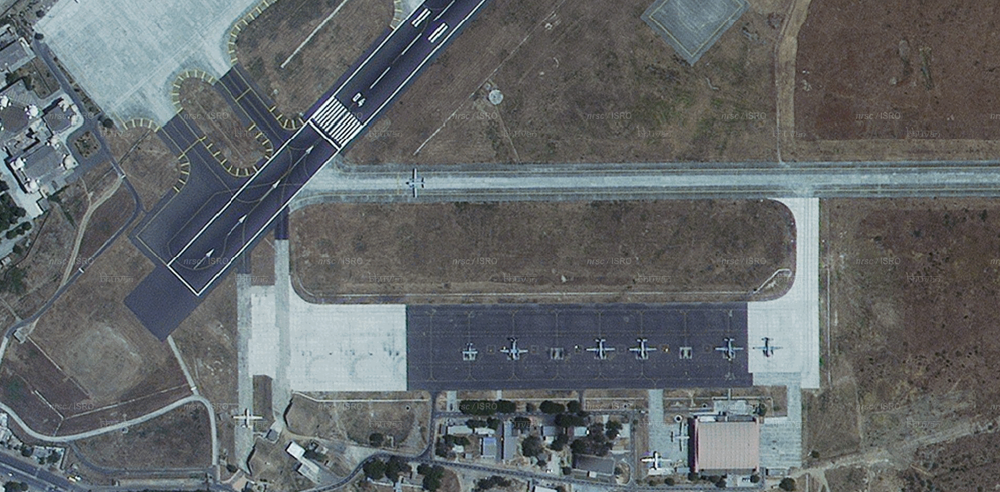

In [36]:
out_dir='fetched_layer_zoom'
generate_custom_stitched_map_sat_layer(22.329,73.22134,'Vadodara_air',out_dir,'bhuvan_hrs_2017')

In [52]:
df[df['City']=='Delhi_air_a']

,City,Type,Latitude,Longitude,Zoom,Drop,Num,link_layer,layer_name
4,Delhi_air_a,Airport,28.56281,77.09934,14.8,True,2025.0,&layer2=High+Resolution+Data+(1m)%3AJAN-JUN+20...,hrs_24r


Zoom: 18, Lat: 28.56753, Lon: 77.11413
--> Using selected layer: 'hrs_24r' for tile requests.

Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_sat_layer_Delhi_air_a_pt1.png' with dimensions 1904x937.


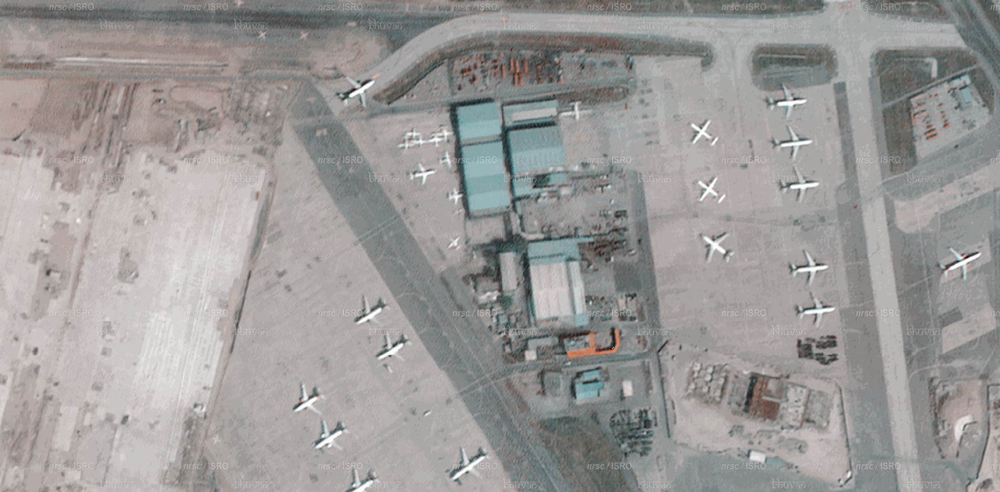

In [56]:
out_dir='fetched_layer_zoom'
generate_custom_stitched_map_sat_layer(28.56753,77.11413,'Delhi_air_a_pt1',out_dir,'hrs_24r')

Zoom: 18, Lat: 18.935, Lon: 72.864
--> Using selected layer: 'bhuvan_hrs_2017' for tile requests.

Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_sat_layer_Mumbai_jawaharlal_sea_pt3.png' with dimensions 1904x937.


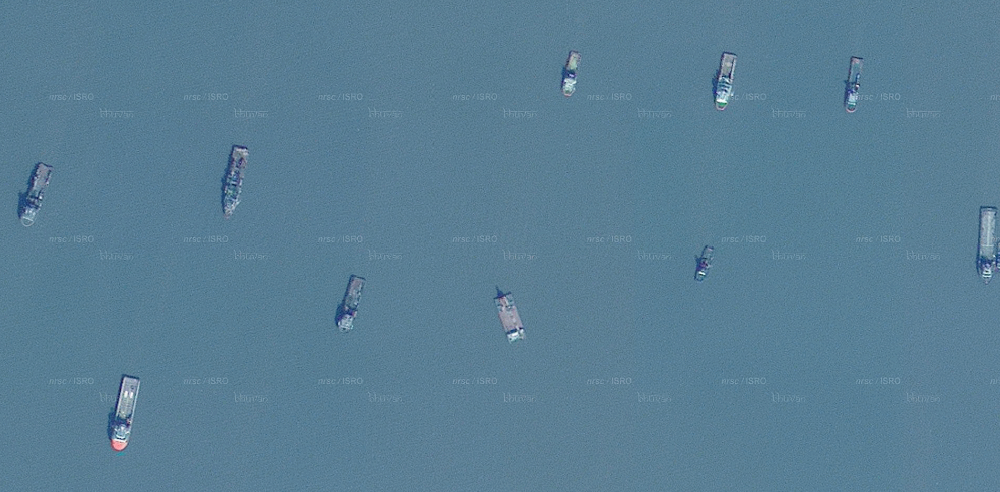

In [71]:
out_dir='fetched_layer_zoom'
generate_custom_stitched_map_sat_layer(18.935,72.864,'Mumbai_jawaharlal_sea_pt3',out_dir,'bhuvan_hrs_2017')

Zoom: 18, Lat: 22.549776, Lon: 88.325
--> Using selected layer: 'bhuvan_hrs_2017' for tile requests.

Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_sat_layer_kolkata_sea_pt2.png' with dimensions 1904x937.


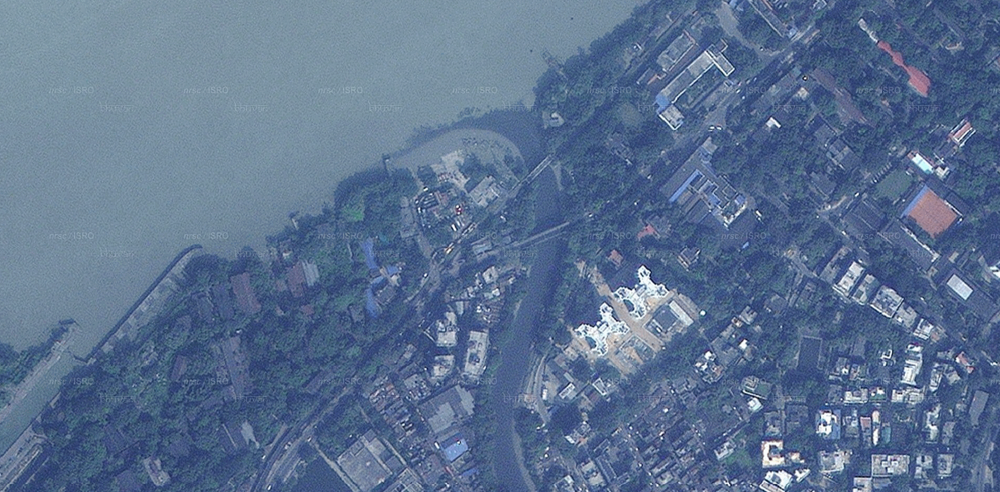

In [72]:
out_dir='fetched_layer_zoom'
generate_custom_stitched_map_sat_layer(22.549776,88.325,'kolkata_sea_pt2',out_dir,'bhuvan_hrs_2017')

Parsed URL -> Zoom:18,Lat: 22.550304, Lon: 88.310998
Calculated 8x6 tile grid to produce a 2048x1536 image.

✅ Success! Map saved as 'bhuvan_ngmap_preview_kolkata_sea_pt3.png' with dimensions 1904x937.


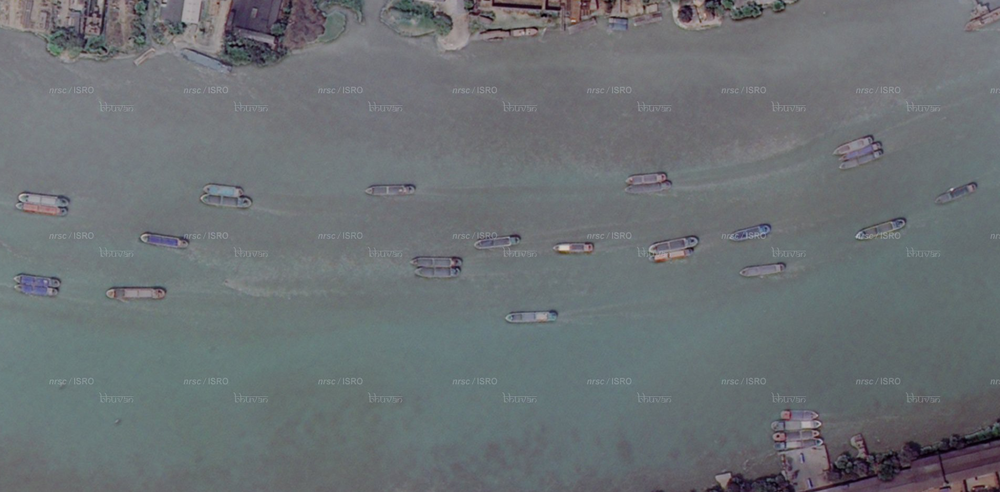

In [70]:
out_dir='fetched_layer_zoom'
generate_custom_stitched_map_ocm_custom_lat_lon(22.550304,88.310998,'kolkata_sea_pt3',out_dir)